## Imports

In [1]:
import os

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torchvision.transforms as transforms
from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader, Subset
from torchvision.datasets import ImageFolder

## Explore Data

In [2]:
data_dir = "../data/garbage_classification_data/Garbage classification/Garbage classification"

classes = os.listdir(data_dir)
print(classes)

['paper', 'metal', 'cardboard', 'trash', 'glass', 'plastic']


In [3]:
transformations = transforms.Compose([transforms.Resize((256, 256)), transforms.ToTensor()])

dataset = ImageFolder(data_dir, transform=transformations)

In [4]:
def show_sample(img, label):
    print("Label:", dataset.classes[label], "(Class No: " + str(label) + ")")
    plt.title("Label: " + dataset.classes[label] + " (Class No: " + str(label) + ")")
    plt.imshow(img.permute(1, 2, 0))
    plt.axis("off")

In [ ]:
def show_samples_grid(dataset, sample_indices, cols=4, figsize=(15, 4), title=None):
    n_samples = len(sample_indices)
    rows = (n_samples + cols - 1) // cols

    fig, axes = plt.subplots(rows, cols, figsize=(figsize[0], figsize[1] * rows))

    if title:
        fig.suptitle(title, fontsize=16, y=1.02)

    if rows == 1 and cols == 1:
        axes = np.array([[axes]])
    elif rows == 1:
        axes = axes.reshape(1, -1)
    elif cols == 1:
        axes = axes.reshape(-1, 1)

    for i, sample_idx in enumerate(sample_indices):
        row = i // cols
        col = i % cols

        img, label = dataset[sample_idx]
        axes[row, col].imshow(img.permute(1, 2, 0))
        axes[row, col].set_title(f"{dataset.classes[label]}\n(Sample {i + 1})")
        axes[row, col].axis("off")

    for i in range(n_samples, rows * cols):
        row = i // cols
        col = i % cols
        axes[row, col].axis("off")

    plt.tight_layout()
    plt.show()


def get_samples_per_class(dataset, n_samples=4):
    class_samples = {class_idx: [] for class_idx in range(len(dataset.classes))}

    for idx, (_, label) in enumerate(dataset):
        if len(class_samples[label]) < n_samples:
            class_samples[label].append(idx)
        if all(len(samples) == n_samples for samples in class_samples.values()):
            break

    return class_samples

In [6]:
dataset

Dataset ImageFolder
    Number of datapoints: 2527
    Root location: ../data/garbage_classification_data/Garbage classification/Garbage classification
    StandardTransform
Transform: Compose(
               Resize(size=(256, 256), interpolation=bilinear, max_size=None, antialias=warn)
               ToTensor()
           )

In [7]:
dataset.class_to_idx

{'cardboard': 0, 'glass': 1, 'metal': 2, 'paper': 3, 'plastic': 4, 'trash': 5}

In [8]:
def plot_label_distribution(labels, title="Label Distribution"):
    plt.figure(figsize=(10, 5))
    sns.histplot(labels, bins=np.arange(len(dataset.classes) + 1) - 0.5, stat="count", discrete=True, shrink=0.8)
    plt.xticks(ticks=range(len(dataset.classes)), labels=dataset.classes, rotation=45)
    plt.xlabel("Classes")
    plt.ylabel("Number of samples")
    plt.title(title)
    plt.show()


def plot_label_distribution_percentage(labels, title="Label Distribution Percentage"):
    plt.figure(figsize=(10, 5))
    sns.histplot(labels, bins=np.arange(len(dataset.classes) + 1) - 0.5, stat="percent", discrete=True, shrink=0.8)
    plt.xticks(ticks=range(len(dataset.classes)), labels=dataset.classes, rotation=45)
    plt.xlabel("Classes")
    plt.ylabel("Percentage of samples (%)")
    plt.title(title)
    plt.show()

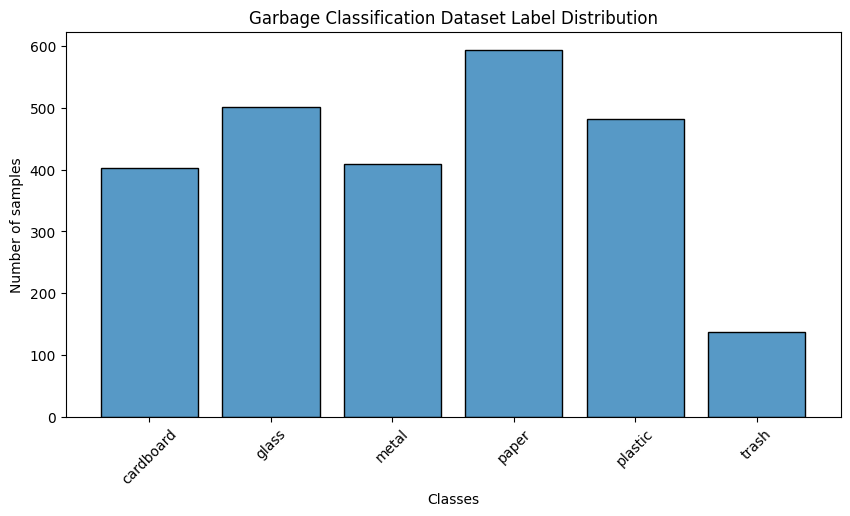

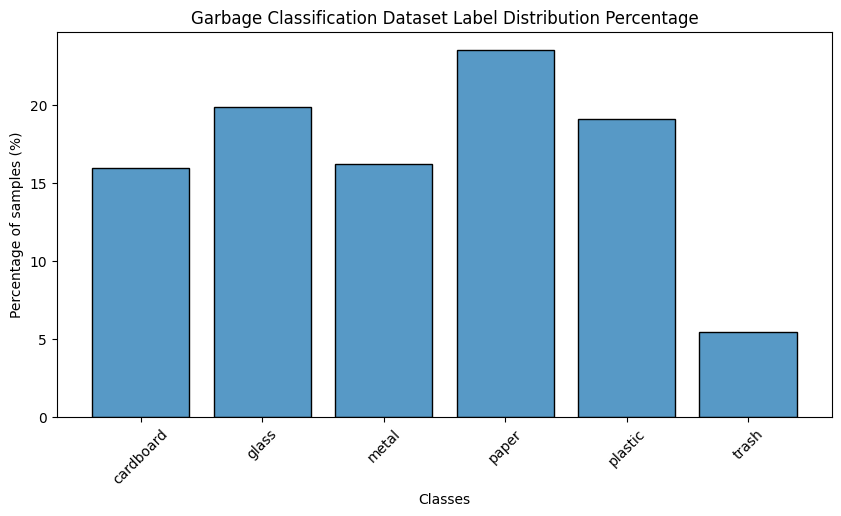

In [9]:
labels = [label for _, label in dataset]
plot_label_distribution(labels, title="Garbage Classification Dataset Label Distribution")
plot_label_distribution_percentage(labels, title="Garbage Classification Dataset Label Distribution Percentage")

In [10]:
class_samples = get_samples_per_class(dataset, n_samples=16)

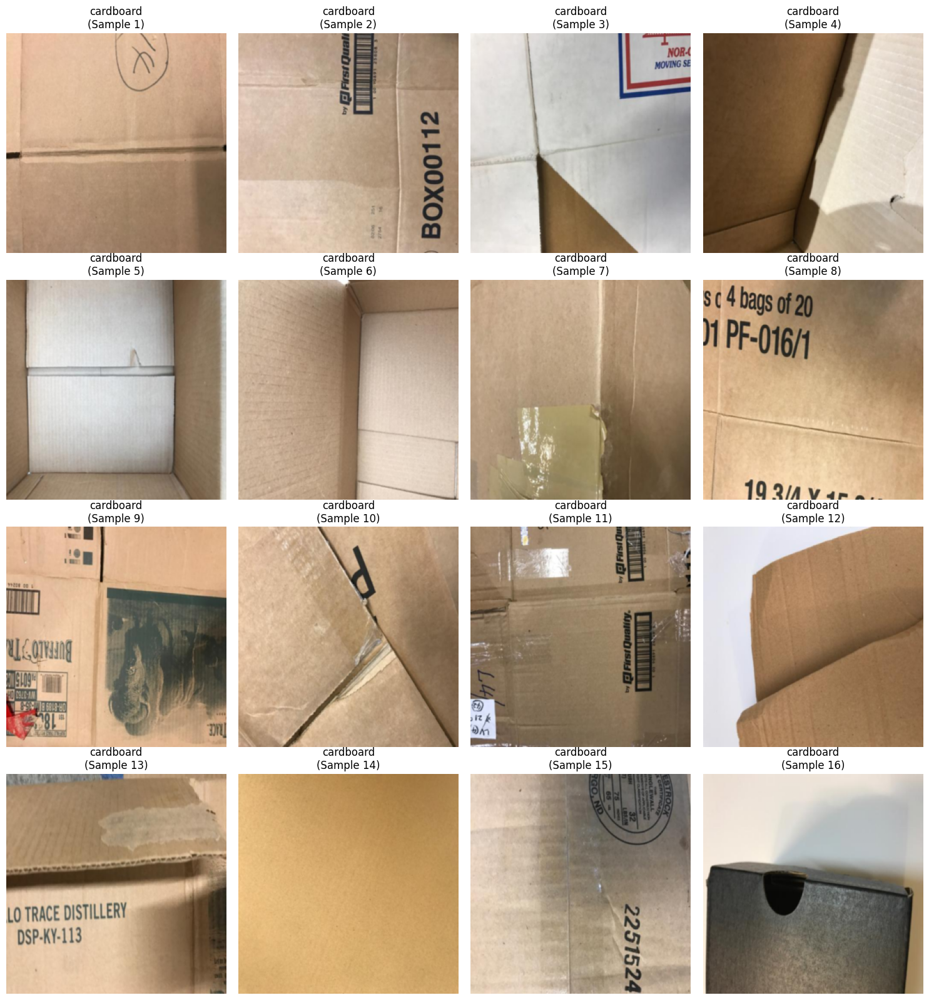

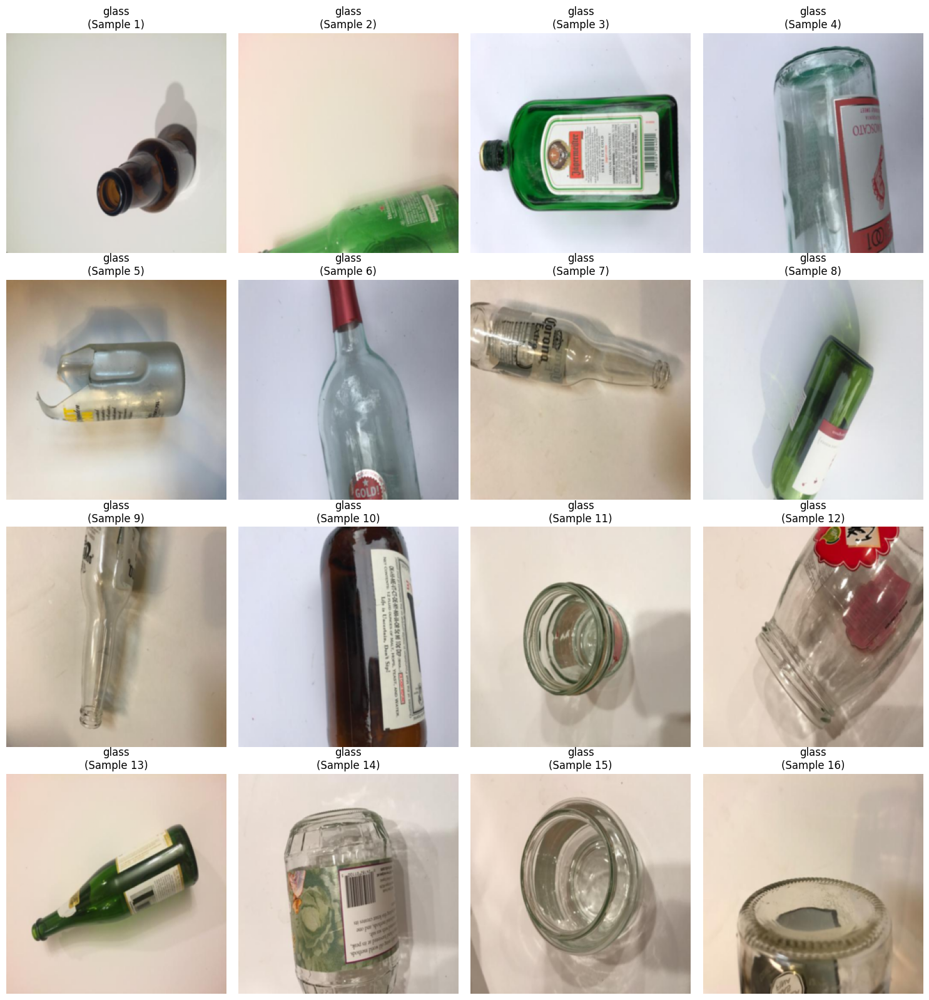

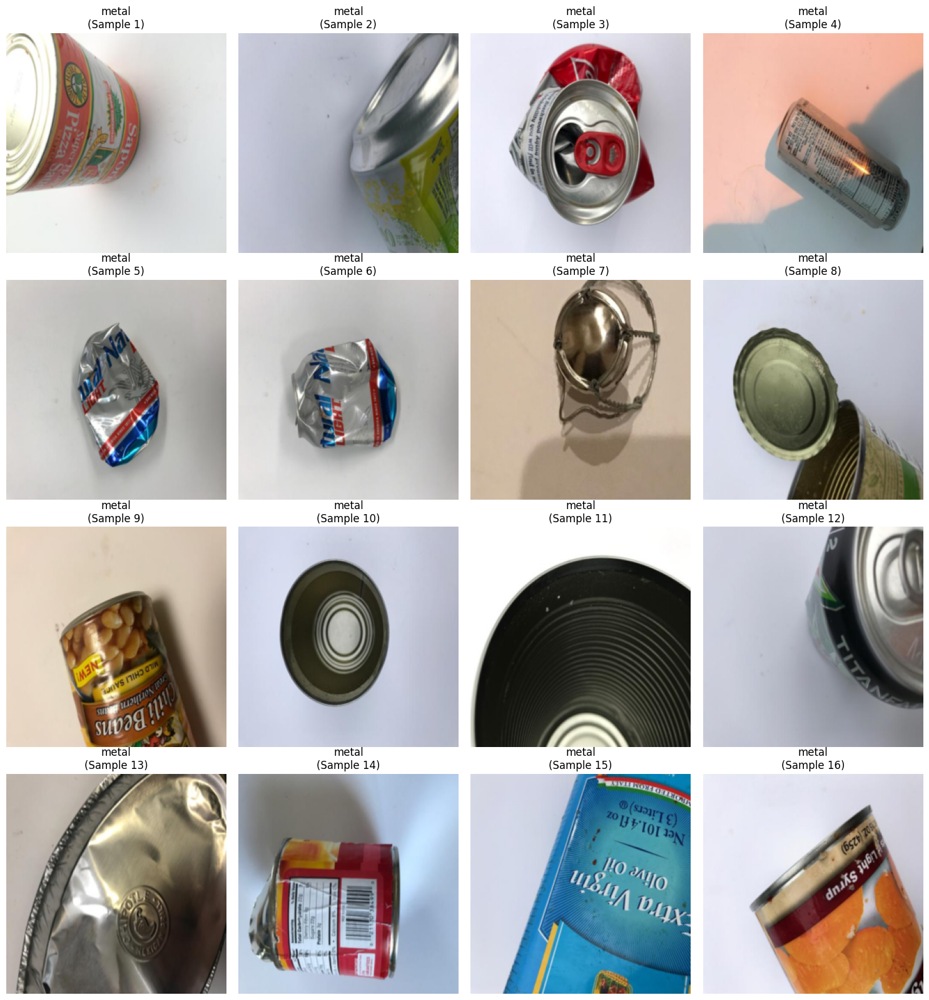

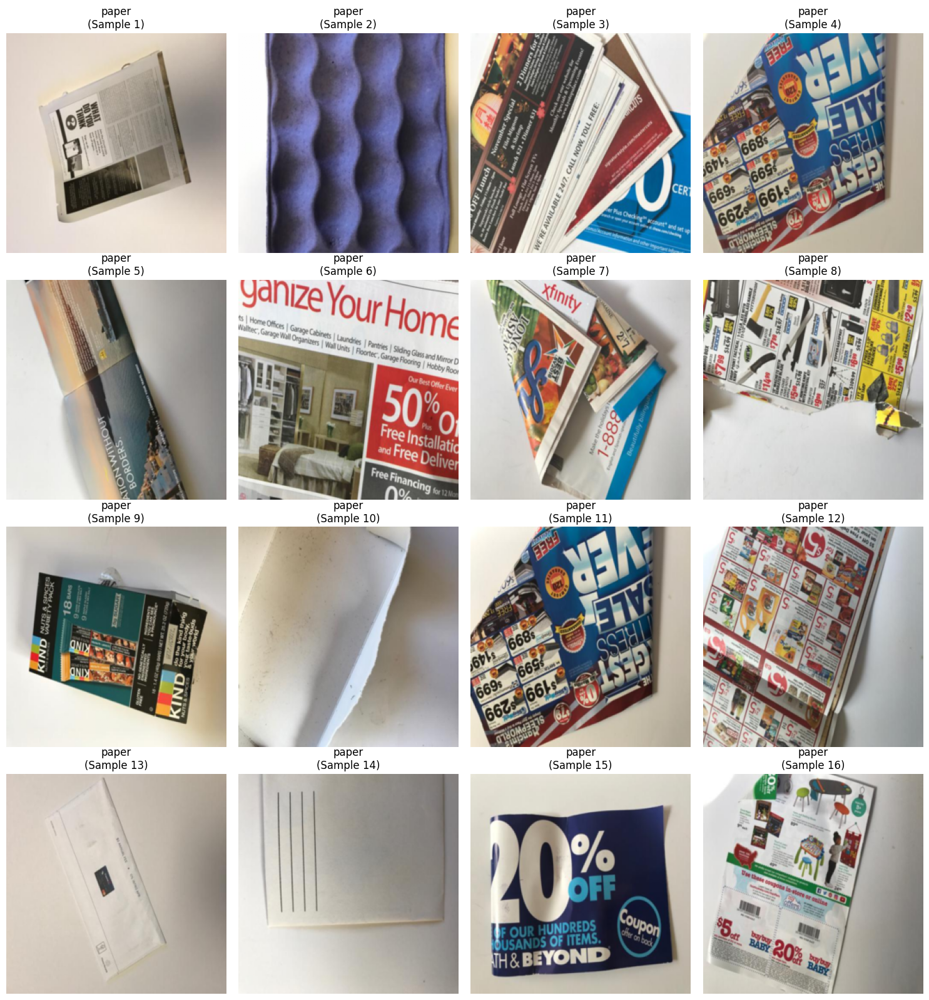

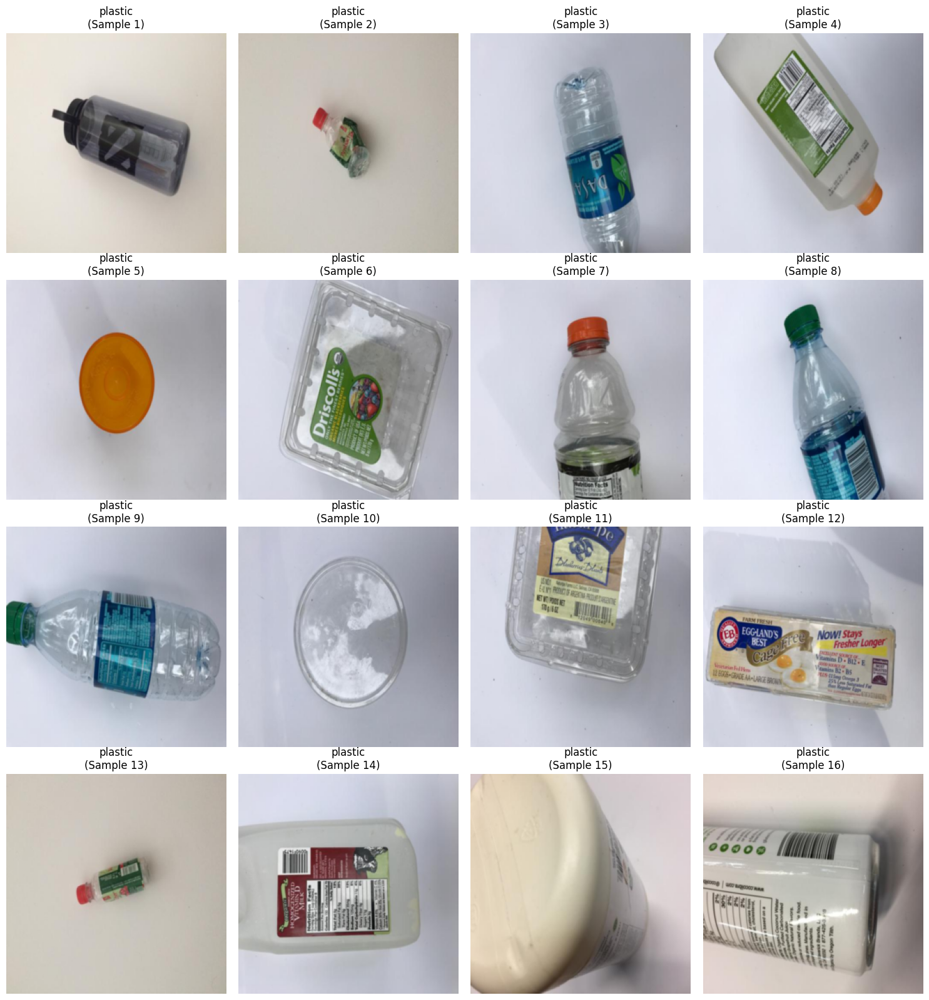

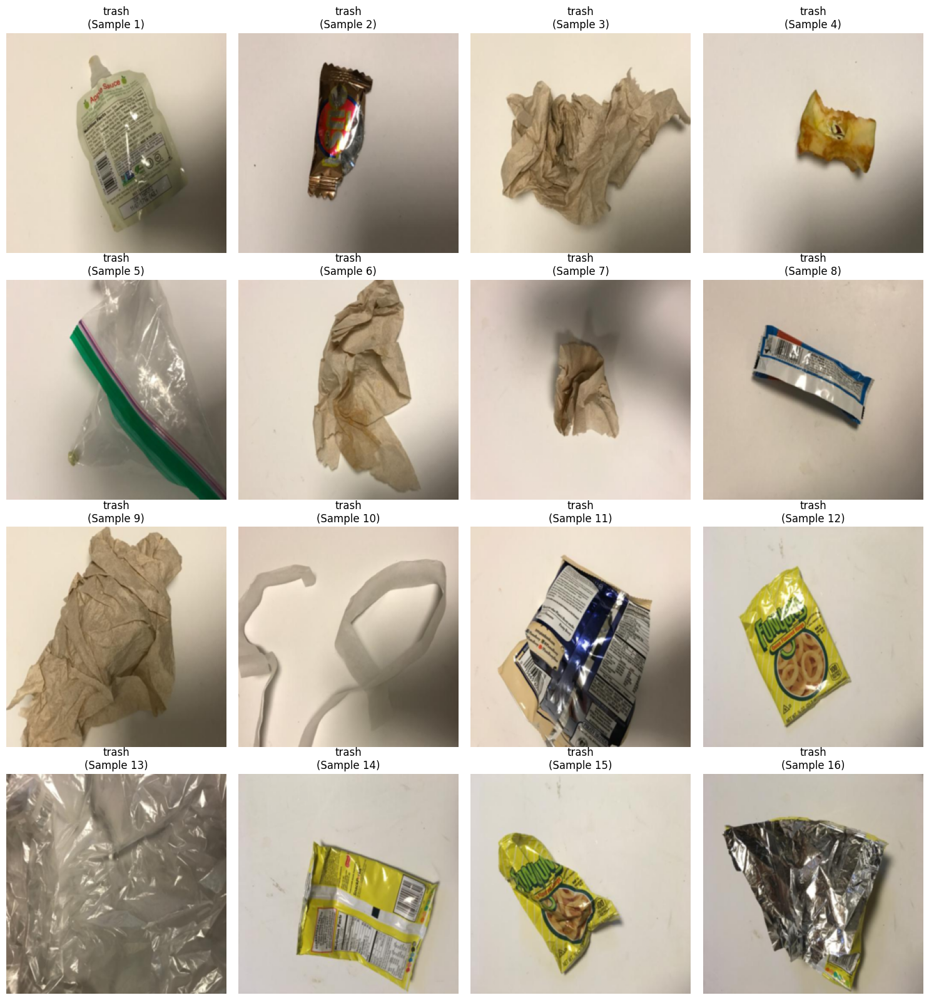

In [11]:
show_samples_grid(dataset, class_samples[0])
show_samples_grid(dataset, class_samples[1])
show_samples_grid(dataset, class_samples[2])
show_samples_grid(dataset, class_samples[3])
show_samples_grid(dataset, class_samples[4])
show_samples_grid(dataset, class_samples[5])

## Create dataloader

In [12]:
# Load indices and targets
indices = list(range(len(dataset)))
targets = [dataset.targets[i] for i in indices]

# Spliting
train_indices, temp_indices = train_test_split(indices, test_size=0.2, stratify=targets, random_state=42)

# Sliting
temp_targets = [dataset.targets[i] for i in temp_indices]
val_indices, test_indices = train_test_split(
    temp_indices,
    test_size=0.5,  # 50% z 20% = 10% całości
    stratify=temp_targets,
    random_state=42,
)

# Create Subsets
train_dataset = Subset(dataset, train_indices)
val_dataset = Subset(dataset, val_indices)
test_dataset = Subset(dataset, test_indices)

# Create DataLoaders
batch_size = 32

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)

val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

print("\nRozmiary zbiorów:")
print(f"Train: {len(train_dataset)} ({len(train_dataset) / len(dataset) * 100:.1f}%)")
print(f"Val:   {len(val_dataset)} ({len(val_dataset) / len(dataset) * 100:.1f}%)")
print(f"Test:  {len(test_dataset)} ({len(test_dataset) / len(dataset) * 100:.1f}%)")
print(f"Total: {len(dataset)}")


Rozmiary zbiorów:
Train: 2021 (80.0%)
Val:   253 (10.0%)
Test:  253 (10.0%)
Total: 2527


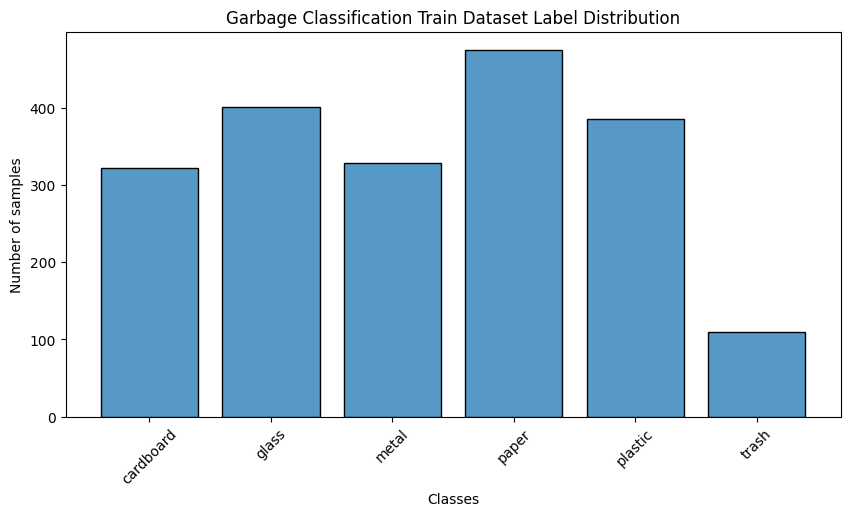

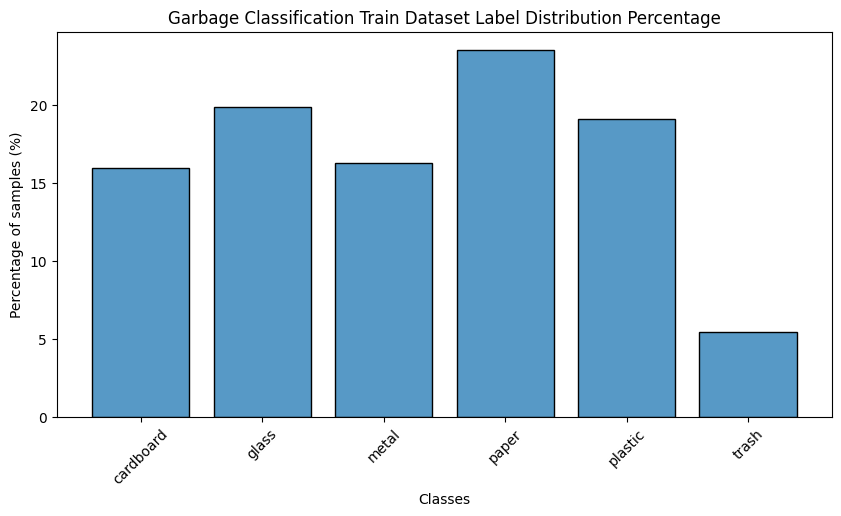

In [13]:
labels = [label for _, label in train_dataset]
plot_label_distribution(labels, title="Garbage Classification Train Dataset Label Distribution")
plot_label_distribution_percentage(labels, title="Garbage Classification Train Dataset Label Distribution Percentage")

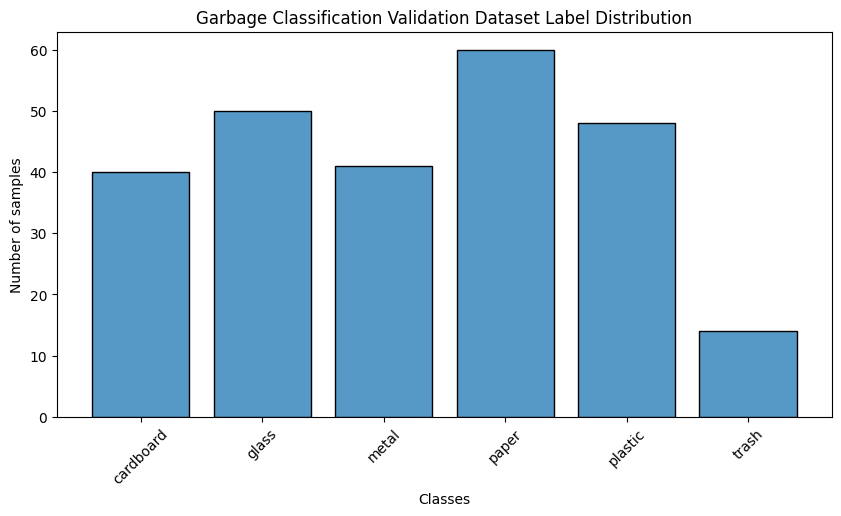

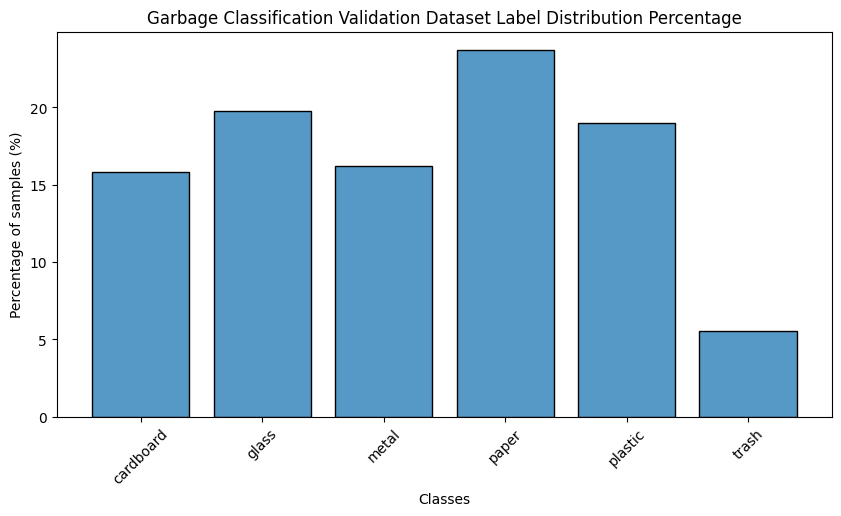

In [14]:
labels = [label for _, label in val_dataset]
plot_label_distribution(labels, title="Garbage Classification Validation Dataset Label Distribution")
plot_label_distribution_percentage(
    labels, title="Garbage Classification Validation Dataset Label Distribution Percentage"
)

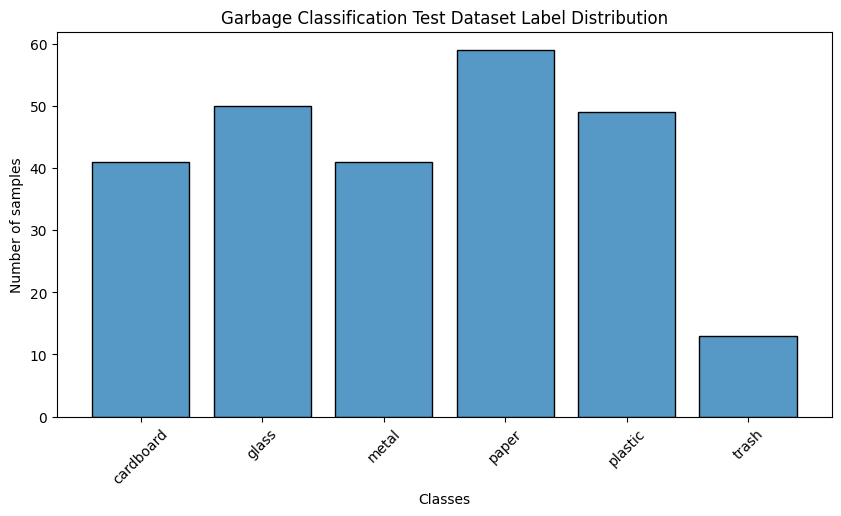

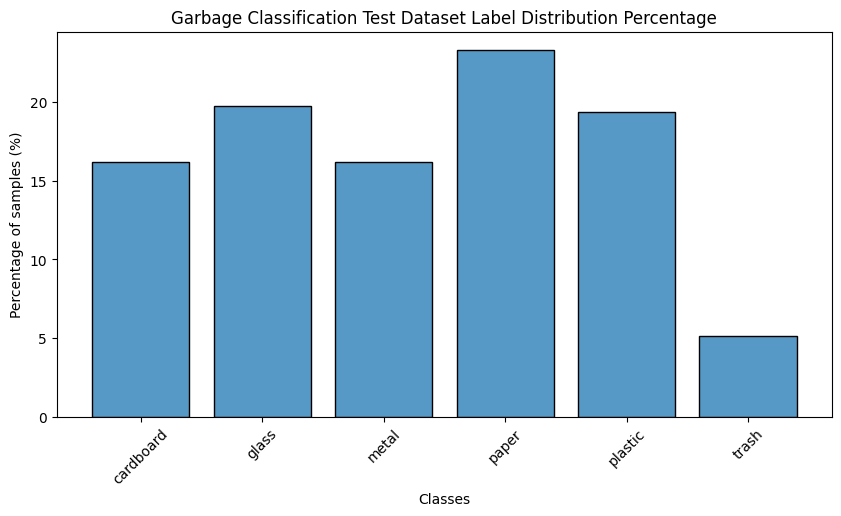

In [15]:
labels = [label for _, label in test_dataset]
plot_label_distribution(labels, title="Garbage Classification Test Dataset Label Distribution")
plot_label_distribution_percentage(labels, title="Garbage Classification Test Dataset Label Distribution Percentage")